In [1]:
import cv2
import numpy as np 
from glob import glob
import os
import imutils
from PIL import Image, ImageEnhance 
import matplotlib.pyplot as plt

# Cropping Images

In [2]:
def croup_countor_lung_image(image , plot=False):
    
    #GRAY IMAGE
    gray_scale = cv2.cvtColor(example_image,cv2.COLOR_BGR2GRAY) 
                 
    gray_scale = cv2.GaussianBlur(gray_scale, (5,5),0)
    threshold_image = cv2.threshold(gray_scale, 45, 255, cv2.THRESH_BINARY)[1]
    
    #REMOVING NOISE
    threshold_image = cv2.erode(threshold_image, None, iterations=2)
    threshold_image = cv2.dilate(threshold_image, None, iterations=2)
    
    countor = cv2.findContours(threshold_image.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    countor = imutils.grab_contours(countor)
    c = max(countor, key=cv2.contourArea)
    
    extreme_pents_left = tuple(c[c[:,:,0].argmin()][0])
    extreme_pents_right = tuple(c[c[:,:,0].argmax()][0])
    extreme_pents_top = tuple(c[c[:,:,1].argmin()][0])
    extreme_pents_bot = tuple(c[c[:,:,1].argmax()][0])
    
    new_image = image[extreme_pents_top[1] : extreme_pents_bot[1] ,extreme_pents_left[0] : extreme_pents_right[0]  ]

    if plot:
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False, labelbottom=False, 
                       labeltop=False, labelleft=False, labelright=False)
        plt.title('original Image')
        
        plt.subplot(1,2,2)
        plt.imshow(new_image)
        plt.title('cropped Image')
        plt.show()
        
        return new_image

In [3]:
def apply_Croupping(image_paths):
    cropped = []
    for path in image_paths:
        image = cv2.imread(path)
        r_image = croup_countor_lung_image(image, True)
        cropped.append(r_image)
    return cropped

(512, 512, 3)


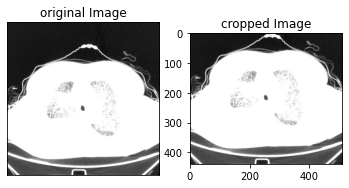

In [4]:
example_image  = cv2.imread("F:/lvl 4/GP DataSet/Categories/A/A304768638.jpg")
print(example_image.shape)
retur = croup_countor_lung_image(example_image, True)
#gray_scale = cv2.cvtColor(example_image,cv2.COLOR_BGR2GRAY) 
#plt.imshow(gray_scale, cmap="gray")

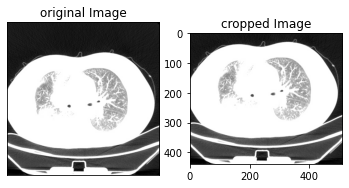

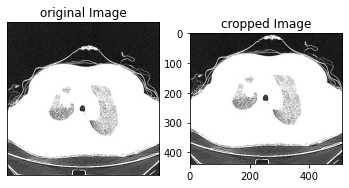

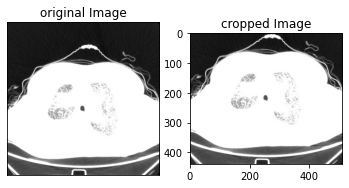

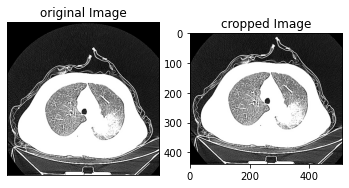

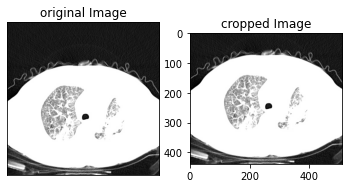

...

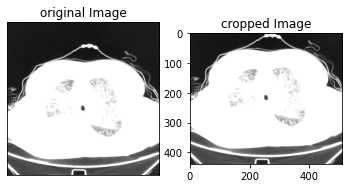

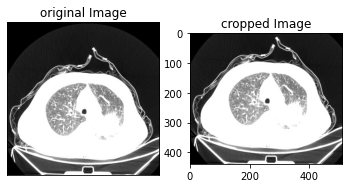

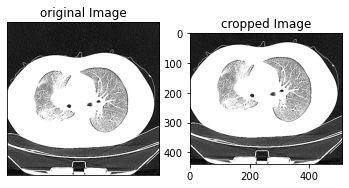

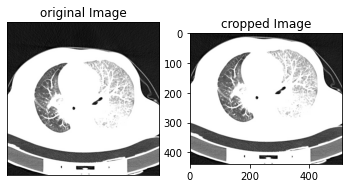

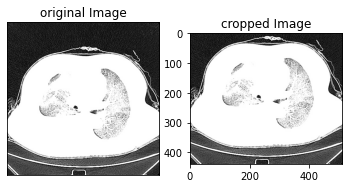

In [5]:
images_path = 'F:/lvl 4/GP DataSet/Categories/A'
path_a = glob(os.path.join(images_path,'*.jpg'))
res = apply_Croupping(path_a)


In [6]:
counter = 0
for img in res:
    cv2.imwrite('F:/lvl 4/GP DataSet/Cropped/' + str(counter) + 'Cropped.jpg' , img)
    counter += 1

# Sharpening Images

In [7]:
Sharpened_images = []
def Sharpening(folder_path):
    images_path = os.listdir(folder_path)
    for image in images_path:
        picture = Image.open(os.path.join(folder_path, image)) 
        enhancer = ImageEnhance.Sharpness(picture)
        enhanced_im = enhancer.enhance(50.0)
        Sharpened_images.append(enhanced_im)
    return Sharpened_images

In [8]:
Sharpened_images = Sharpening('F:/lvl 4/GP DataSet/Cropped/')

In [9]:
len(Sharpened_images)

98

# Segmenting Images

In [10]:
def get_images_from_path (folder_path):
    images_path = os.listdir(folder_path)
    pictures = []
    for image in images_path:
        picture = cv2.imread(os.path.join(folder_path, image)) 
        pictures.append(picture)
    return pictures 

In [11]:
def segmentation(img , mask):
    
    h, w = img.shape[:2]
    for row in range(h):
        if mask[row, 0] == 255:
            cv2.floodFill(mask, None, (0, row), 0)
        if mask[row, w-1] == 255:
            cv2.floodFill(mask, None, (w-1, row), 0)
    for col in range(w):
        if mask[0, col] == 255:
            cv2.floodFill(mask, None, (col, 0), 0)
        if mask[h-1, col] == 255:
            cv2.floodFill(mask, None, (col, h-1), 0)

    # flood fill background to find inner holes
    holes = mask.copy()
    cv2.floodFill(holes, None, (0, 0), 255)

    # invert holes mask, bitwise or with mask to fill in holes
    holes = cv2.bitwise_not(holes)
    mask = cv2.bitwise_or(mask, holes)

    # display masked image
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    masked_img_with_alpha = cv2.merge([img, img, img, mask])
    #cv2.imwrite('F:/lvl 4/GP DataSet/Segmented/' + str(counter) + 'Segmented.png', masked_img)
    #cv2.imwrite('F:/lvl 4/GP DataSet/Segmented/' + str(counter) + 'Segmented.png', masked_img_with_alpha)
    #counter += 1
    return masked_img

In [14]:
all_masks  = get_images_from_path('F:/lvl 4/GP DataSet/Masks/')
segmented_images = []
counter = 0
for img in Sharpened_images:
    try:
        ret, mask = cv2.threshold(np.array(img.convert('RGB')) , 150 , 255 , cv2.THRESH_BINARY_INV) 
        #mask[:,:,0]               => To convert the mask from 3d (h , w , 3) to 2d (h , w)
        #np.ascontiguousarray      => Function is used when we want to return a contiguous array in memory (C order)
        #np.array(.convert('RGB')) => We have to convert the PIL image into cv2 because cv2.Threshold accepts onlt cv2 images
        segmented_images.append(segmentation(np.array(Sharpened_images[0].convert('RGB')) , np.ascontiguousarray(mask[:,:,0], dtype=np.uint8)))
        counter += 1
    except:
        print('Error' + str(counter))
        counter += 1

In [15]:
len(segmented_images)

98

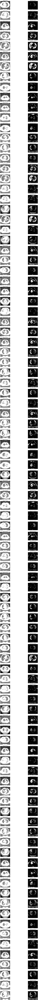

In [17]:
n = len(segmented_images) #Number of images
f, axes  = plt.subplots(n , 2 , sharey = True , figsize = (20, 400))

for i in range(n):
    axes[i , 0].imshow(Sharpened_images[i], cmap='gray')
    axes[i , 0].set_title("Original Lung #{}" .format(i))
    axes[i , 0].axis('off')

    axes[i , 1].imshow(segmented_images[i], cmap='gray')
    axes[i , 1].set_title("Segmented Lung #{}" .format(i))
    axes[i , 1].axis('off')

plt.show()